# Import packages

In [1]:
import pandas as pd
import numpy as np
import os
import shap
import matplotlib.pyplot as plt
import torch
import transformers
from transformers import AutoTokenizer, DistilBertForSequenceClassification
import joblib
import requests

In [2]:
# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda:1")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 4 GPU(s) available.
We will use the GPU: Tesla V100-SXM2-32GB


# Test

In [3]:

# Load data
db_data_path = '../../data/02_processed/distilbert_data/train/'
db_files = [file for file in os.listdir(db_data_path) if file.endswith('clean.csv')]
db_files.sort()
file = db_files[1]
data = pd.read_csv(db_data_path + file)

# Load the corresponding distilbert model and tokenizer from huggingface
metric_name = file.split('.')[0].split('_')[0] # Get the metric name to load the corresponding model
print(metric_name)
hub_path = 'lenguyen/' + 'distilbert_' + metric_name
model = DistilBertForSequenceClassification.from_pretrained(hub_path).to(device)
tokenizer = AutoTokenizer.from_pretrained(hub_path)

# Load scaler to inverse transform the predicted values
scaler = joblib.load(open('../../models/finbert-regression/distilbert_data/' + metric_name + '_scaler.pkl', 'rb'))

EarningsPerShareDiluted


In [ ]:
# Initialise explainer
explainer = shap.Explainer(f_batch, tokenizer)

# Get the first 10 samples from the dataset
texts = data['text'].values

# Explain the model's predictions using SHAP values
shap_values = explainer(texts, fixed_context=1, nsamples=300)

shap.plots.bar(shap_values.abs.mean(0))

# Load data, model and scaler

In [4]:
# Get list of flies from DistilBERT's data folder
db_data_path = '../../data/02_processed/distilbert_data/train/'
db_files = [file for file in os.listdir(db_data_path) if file.endswith('clean.csv')]
db_files.sort()
db_files

['EBIT_train__text_clean.csv',
 'EarningsPerShareDiluted_train__text_clean.csv',
 'NetCashProvidedByUsedInFinancingActivities_train__text_clean.csv',
 'NetCashProvidedByUsedInInvestingActivities_train__text_clean.csv',
 'NetIncomeLoss_train__text_clean.csv',
 'RevenueFromContractWithCustomerExcludingAssessedTax_train__text_clean.csv']

In [5]:
# Get list of flies from FinBERT's data folder
fb_data_path = '.../../data/02_processed/finbert_data/train/'
fb_files = [file for file in os.listdir(fb_data_path) if file.endswith('clean.csv')]
fb_files.sort()
fb_files

['EBIT_train__text_clean.csv',
 'EarningsPerShareDiluted_train__text_clean.csv',
 'NetCashProvidedByUsedInFinancingActivities_train__text_clean.csv',
 'NetCashProvidedByUsedInInvestingActivities_train__text_clean.csv',
 'NetIncomeLoss_train__text_clean.csv',
 'RevenueFromContractWithCustomerExcludingAssessedTax_train__text_clean.csv']

## Function to load data, model and scaler

In [6]:
# Function to load the model and scaler 
def load_data_model_and_scaler(file_path, file_name, hub_path, scaler_path):
    # Function to load the model and scaler
    # Input:
        # file_path: path to the data folder
        # file_name: name of the file to load
        # hub_path: path to the huggingface model
        # scaler_path: path to the scaler
    # Output:
        # data: pandas dataframe
        # model: huggingface model
        # tokenizer: huggingface tokenizer
        # scaler: sklearn scaler
    # Load data 
    data = pd.read_csv(file_path + file_name)
    
    # Load model and tokenizer
    model = DistilBertForSequenceClassification.from_pretrained(hub_path).to(device)
    tokenizer = AutoTokenizer.from_pretrained(hub_path)
    
    # Load scaler to inverse transform the predicted values
    scaler = joblib.load(open(scaler_path, 'rb'))
    return data, model, tokenizer, scaler    

# Interpret models

In [8]:
# Predict function for SHAP
def predict(text):
    # Function to predict financial performance based on text
    # Input:
        # text: text to predict
    # Output:
        # prediction: predicted financial performance
    input = torch.tensor(
        tokenizer.encode(text,padding='max_length', truncation=True, max_length=300)
    ).to(device)
    input = input.unsqueeze(0)
    
    with torch.no_grad():
        output = model(input)
        logit = output[0]
        logit = logit.cpu().numpy()
        prediction = scaler.inverse_transform(logit).item()
    return prediction

def f_batch(texts):
    predictions = []
    for text in texts:
        prediction = predict(text)
        predictions.append(prediction)
    return predictions

In [15]:
# Function to explain the model with SHAP
def shap_interpret_model(data, model, tokenizer, scaler, n_samples=None):
    # Function to explain the model with SHAP
    # Input:
        # data: pandas dataframe
        # model: FinBERT model
        # tokenizer: FinBERT tokenizer
        # scaler: standard scaler
        # n_samples: number of samples to get from the data
    # Output:
        # shap_values: shap values
        
        
    # Get a sample of the data when data is too large
    if n_samples is not None:
        if len(data) > n_samples:
            sample = data.sample(n_samples, random_state=42)
            sample = sample.reset_index(drop=True)
        else:
            sample = data    
    
    # Get the explainer
    explainer = shap.Explainer(f_batch, tokenizer)
    
    # Get the shap values
    shap_values = explainer(sample['text'], fixed_context=1)
    
    # Plot the shap values
    shap.plots.bar(shap_values.abs.mean(0), max_display=11)
    
    return shap_values

# Run through all data and their corresponding models

## DistilBERT

--------------INTERPRETING FINBERT REGRESSION MODEL OF EBIT--------------


PartitionExplainer explainer:  21%|██        | 38/183 [00:15<01:02,  2.32it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  71%|███████   | 130/183 [01:14<00:25,  2.08it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 184it [01:58,  1.35it/s]                         


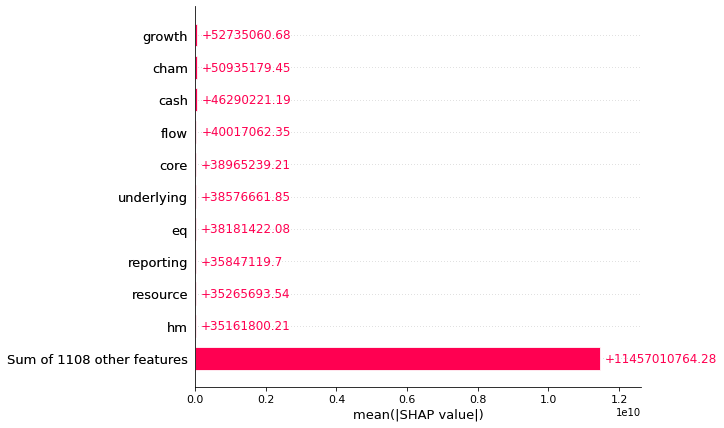

--------------INTERPRETING FINBERT REGRESSION MODEL OF EarningsPerShareDiluted--------------


PartitionExplainer explainer:  31%|███       | 110/354 [01:32<04:29,  1.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  39%|███▊      | 137/354 [01:55<01:14,  2.91it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  92%|█████████▏| 325/354 [04:49<00:50,  1.74s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  98%|█████████▊| 347/354 [05:17<00:10,  1.46s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 355it [05:29,  1.04it/s]                         


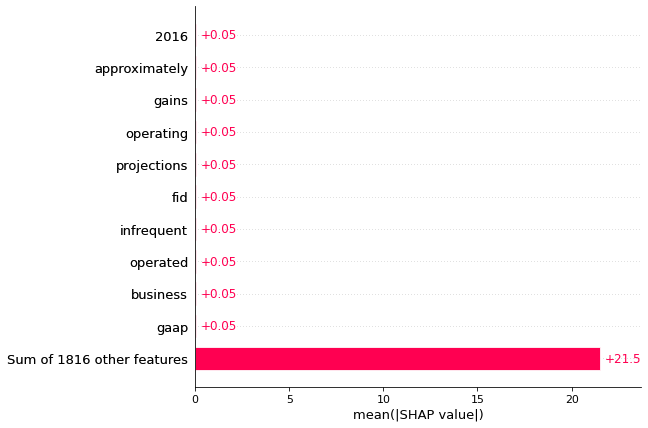

--------------INTERPRETING FINBERT REGRESSION MODEL OF NetCashProvidedByUsedInFinancingActivities--------------
ERROR: NetCashProvidedByUsedInFinancingActivities model is not available in hub
--------------INTERPRETING FINBERT REGRESSION MODEL OF NetCashProvidedByUsedInInvestingActivities--------------


PartitionExplainer explainer: 32it [00:23,  1.22s/it]                        


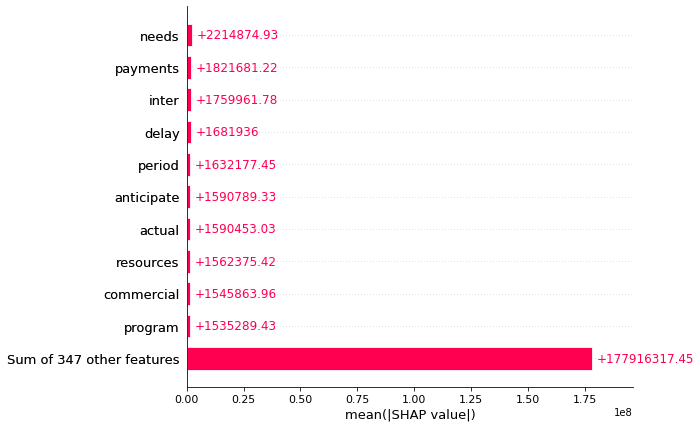

--------------INTERPRETING FINBERT REGRESSION MODEL OF NetIncomeLoss--------------


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   2%|▏         | 20/1000 [00:13<05:32,  2.95it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   3%|▎         | 30/1000 [00:22<07:18,  2.21it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   5%|▌         | 53/1000 [00:42<18:41,  1.18s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  17%|█▋        | 169/1000 [01:51<05:42,  2.42it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  48%|████▊     | 477/1000 [05:07<03:53,  2.24it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  59%|█████▉    | 594/1000 [06:21<08:15,  1.22s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|█████▉    | 595/1000 [06:30<24:58,  3.70s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  61%|██████▏   | 614/1000 [06:52<06:11,  1.04it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  63%|██████▎   | 627/1000 [07:09<05:28,  1.14it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  65%|██████▌   | 652/1000 [07:42<05:07,  1.13it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  67%|██████▋   | 672/1000 [08:13<06:04,  1.11s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  68%|██████▊   | 679/1000 [08:30<08:35,  1.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  71%|███████   | 712/1000 [09:08<05:22,  1.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  75%|███████▍  | 749/1000 [09:48<03:29,  1.20it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|████████  | 804/1000 [10:50<03:19,  1.02s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  83%|████████▎ | 830/1000 [11:25<02:44,  1.03it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  84%|████████▍ | 844/1000 [11:44<02:42,  1.04s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  85%|████████▍ | 848/1000 [11:57<05:08,  2.03s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  88%|████████▊ | 878/1000 [12:40<03:17,  1.62s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  88%|████████▊ | 884/1000 [12:56<02:57,  1.53s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  88%|████████▊ | 885/1000 [13:06<07:27,  3.89s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  90%|█████████ | 902/1000 [13:30<01:33,  1.05it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  91%|█████████ | 908/1000 [13:47<02:39,  1.73s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  92%|█████████▏| 922/1000 [14:14<01:46,  1.37s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  93%|█████████▎| 930/1000 [14:32<01:21,  1.16s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  94%|█████████▍| 940/1000 [14:54<01:25,  1.42s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  96%|█████████▋| 963/1000 [15:23<00:26,  1.39it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  97%|█████████▋| 967/1000 [15:37<01:00,  1.85s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  98%|█████████▊| 977/1000 [16:00<00:24,  1.06s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|█████████▉| 999/1000 [16:29<00:00,  1.25it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 1001it [16:37,  1.01s/it]                          


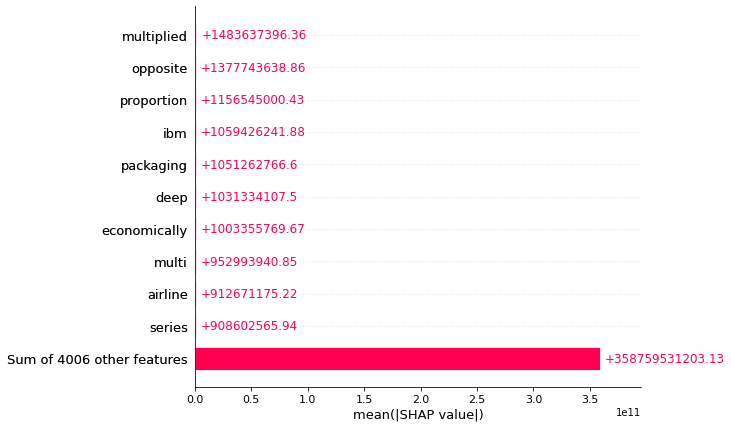

--------------INTERPRETING FINBERT REGRESSION MODEL OF RevenueFromContractWithCustomerExcludingAssessedTax--------------


PartitionExplainer explainer:   2%|▏         | 19/1000 [00:20<17:38,  1.08s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   2%|▏         | 23/1000 [00:29<23:25,  1.44s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   3%|▎         | 33/1000 [00:45<15:51,  1.02it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  15%|█▍        | 148/1000 [03:09<16:31,  1.16s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  19%|█▉        | 193/1000 [04:16<17:09,  1.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  21%|██        | 208/1000 [04:43<16:40,  1.26s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  21%|██        | 210/1000 [04:50<27:46,  2.11s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  28%|██▊       | 277/1000 [06:18<14:58,  1.24s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  29%|██▉       | 292/1000 [06:42<13:07,  1.11s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  42%|████▏     | 415/1000 [09:03<08:27,  1.15it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  49%|████▉     | 489/1000 [10:26<09:03,  1.06s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  52%|█████▏    | 522/1000 [11:10<11:04,  1.39s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  54%|█████▍    | 539/1000 [11:33<09:19,  1.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  55%|█████▍    | 545/1000 [11:46<09:36,  1.27s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  61%|██████    | 609/1000 [13:11<07:35,  1.16s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  67%|██████▋   | 673/1000 [14:41<06:57,  1.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  68%|██████▊   | 684/1000 [14:58<05:12,  1.01it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  71%|███████   | 710/1000 [15:38<07:54,  1.64s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  72%|███████▏  | 720/1000 [15:59<05:37,  1.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  78%|███████▊  | 782/1000 [17:21<04:34,  1.26s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  82%|████████▏ | 818/1000 [18:11<03:30,  1.16s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  83%|████████▎ | 833/1000 [18:38<03:57,  1.42s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  86%|████████▌ | 859/1000 [19:17<01:59,  1.18it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  90%|████████▉ | 895/1000 [20:03<02:34,  1.47s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  93%|█████████▎| 929/1000 [20:54<01:23,  1.17s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  96%|█████████▌| 958/1000 [21:32<00:51,  1.22s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  96%|█████████▌| 959/1000 [21:37<01:40,  2.45s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 1001it [22:25,  1.35s/it]                          


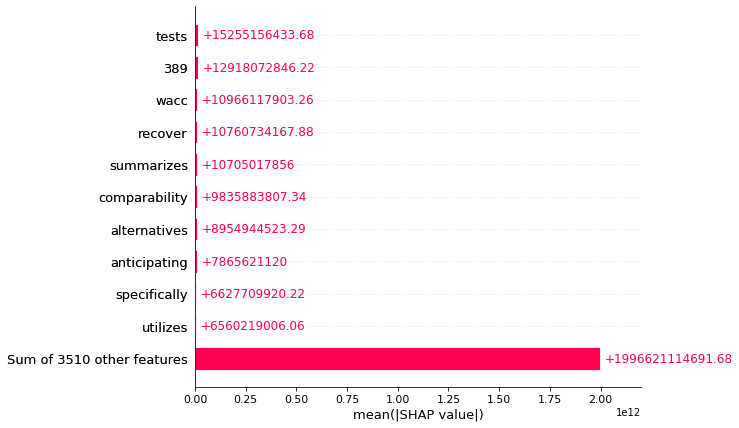

In [16]:
for i in range(len(db_files)):
    file = db_files[i]
    metric_name = file.split('.')[0].split('_')[0]
    
    print(f"--------------INTERPRETING FINBERT REGRESSION MODEL OF {metric_name}--------------")
    
    # Specify the paths to load the data, model and scaler 
    try:
        hub_path = 'lenguyen/' + 'distilbert_' + metric_name
        scaler_path = '../../models/finbert-regression/distilbert_data/' + metric_name + '_scaler.pkl'
        
        # Load data, model and scaler
        data, model, tokenizer, scaler = load_data_model_and_scaler(db_data_path, file, hub_path, scaler_path)
        
        # Explain the model
        shap_values = shap_interpret_model(data, model, tokenizer, scaler, n_samples=1000)
        
        # Save shap values
        joblib.dump(shap_values, f'../../models/finbert-regression/distilbert_data/{metric_name}_shap-values.pkl')
        
        
    except (Exception) as e:
        print(f"ERROR: {metric_name} model is not available in hub")
        continue

## FinBERT

--------------INTERPRETING FINBERT REGRESSION MODEL OF EBIT--------------


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  17%|█▋        | 32/187 [00:39<02:39,  1.03s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  58%|█████▊    | 109/187 [02:21<01:28,  1.13s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  72%|███████▏  | 135/187 [02:53<00:39,  1.30it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 188it [04:06,  1.33s/it]                         


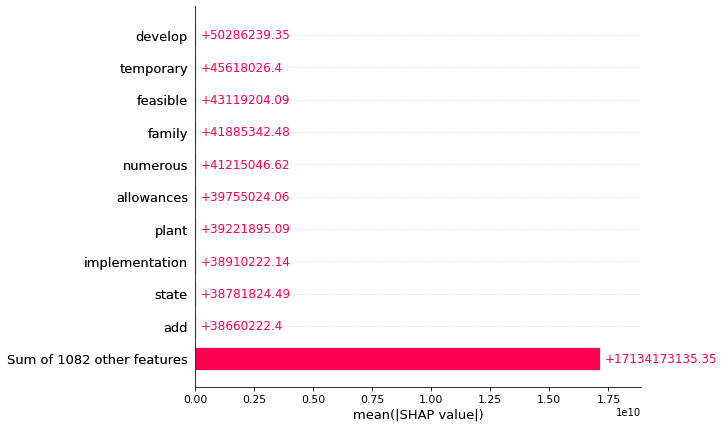

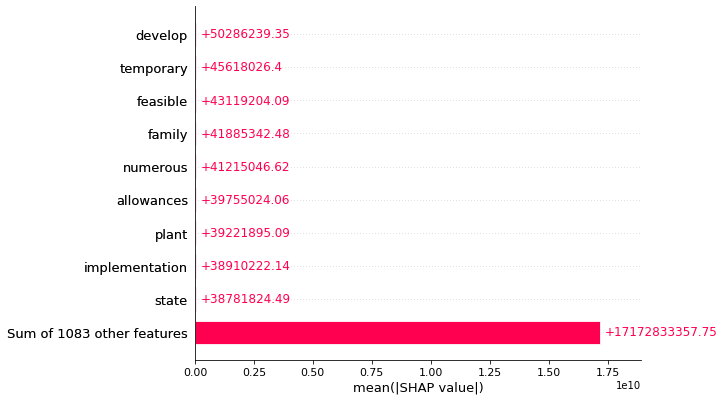

--------------INTERPRETING FINBERT REGRESSION MODEL OF EarningsPerShareDiluted--------------


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   3%|▎         | 11/354 [00:13<04:51,  1.18it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   5%|▍         | 17/354 [00:25<07:29,  1.33s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   6%|▌         | 21/354 [00:40<14:01,  2.53s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   6%|▌         | 22/354 [00:48<21:54,  3.96s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   7%|▋         | 26/354 [00:59<14:05,  2.58s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  12%|█▏        | 42/354 [01:23<05:50,  1.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  12%|█▏        | 44/354 [01:35<16:01,  3.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  13%|█▎        | 45/354 [01:41<19:46,  3.84s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  14%|█▍        | 49/354 [01:49<10:06,  1.99s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  21%|██▏       | 76/354 [02:30<03:46,  1.23it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  23%|██▎       | 81/354 [02:42<06:52,  1.51s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  25%|██▍       | 87/354 [02:52<04:47,  1.08s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  29%|██▊       | 101/354 [03:15<07:17,  1.73s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  30%|██▉       | 105/354 [03:24<06:21,  1.53s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  35%|███▍      | 123/354 [03:57<04:17,  1.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  39%|███▊      | 137/354 [04:19<04:29,  1.24s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  40%|███▉      | 140/354 [04:32<08:50,  2.48s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  45%|████▍     | 158/354 [05:02<03:00,  1.09it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  48%|████▊     | 170/354 [05:23<04:00,  1.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  49%|████▉     | 173/354 [05:31<05:53,  1.96s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  51%|█████     | 180/354 [05:49<04:47,  1.65s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  54%|█████▍    | 191/354 [06:11<06:03,  2.23s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  55%|█████▍    | 193/354 [06:22<09:30,  3.54s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  56%|█████▌    | 199/354 [06:35<05:04,  1.97s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|█████▉    | 211/354 [06:51<01:50,  1.29it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  70%|███████   | 248/354 [07:47<02:37,  1.49s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  71%|███████   | 250/354 [07:56<04:33,  2.63s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  76%|███████▋  | 270/354 [08:31<01:33,  1.11s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|███████▉  | 283/354 [08:50<01:20,  1.14s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  83%|████████▎ | 293/354 [09:09<01:22,  1.36s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  87%|████████▋ | 307/354 [09:30<00:48,  1.04s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  89%|████████▉ | 315/354 [09:49<01:02,  1.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  90%|█████████ | 320/354 [09:59<00:52,  1.54s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  92%|█████████▏| 324/354 [10:10<00:55,  1.84s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  96%|█████████▌| 339/354 [10:35<00:22,  1.53s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  97%|█████████▋| 345/354 [10:47<00:15,  1.69s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  99%|█████████▉| 350/354 [10:58<00:05,  1.36s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 355it [11:10,  1.92s/it]                         


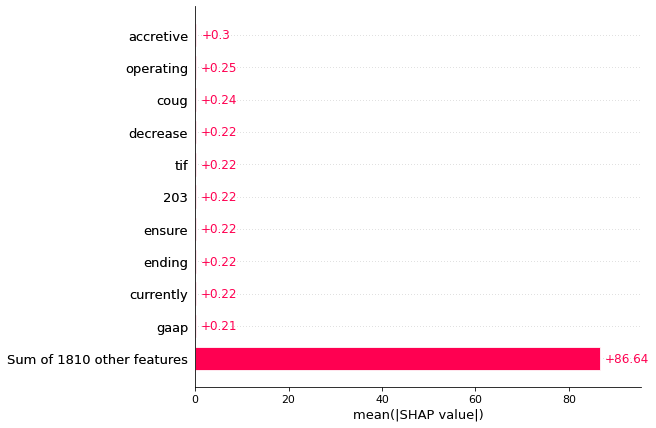

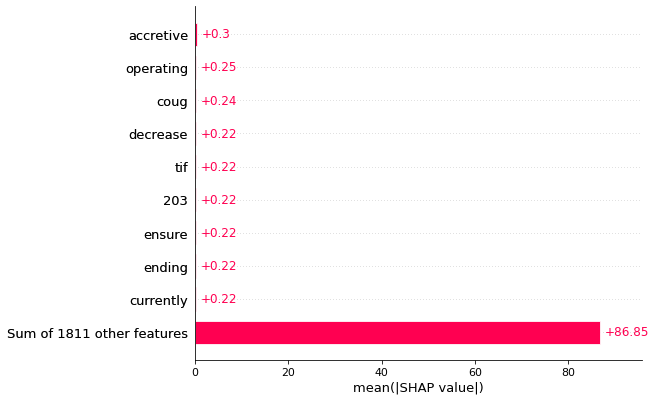

--------------INTERPRETING FINBERT REGRESSION MODEL OF NetCashProvidedByUsedInFinancingActivities--------------


PartitionExplainer explainer: 17it [00:10,  5.37s/it]                


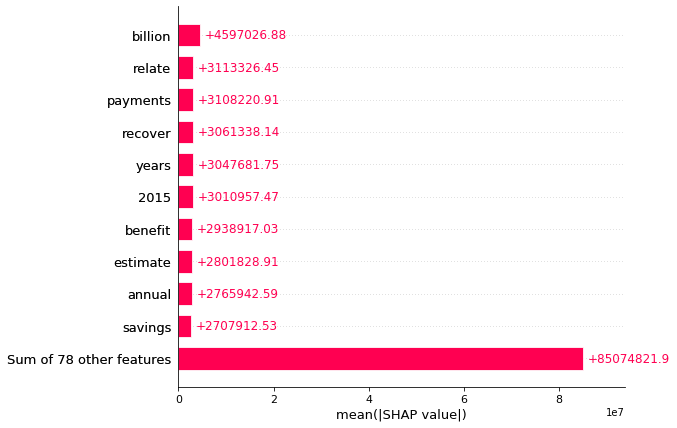

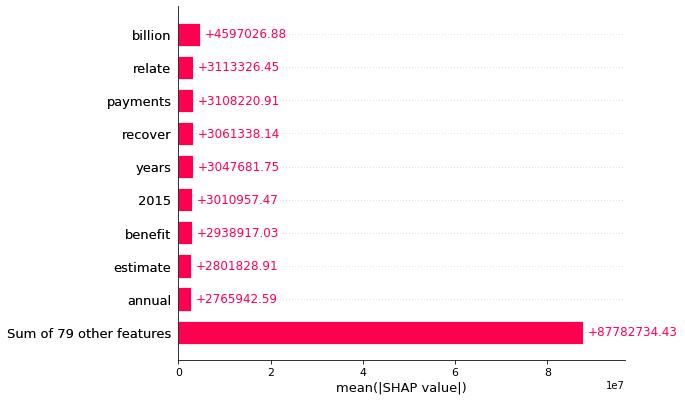

--------------INTERPRETING FINBERT REGRESSION MODEL OF NetCashProvidedByUsedInInvestingActivities--------------


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 31it [00:53,  2.12s/it]                        


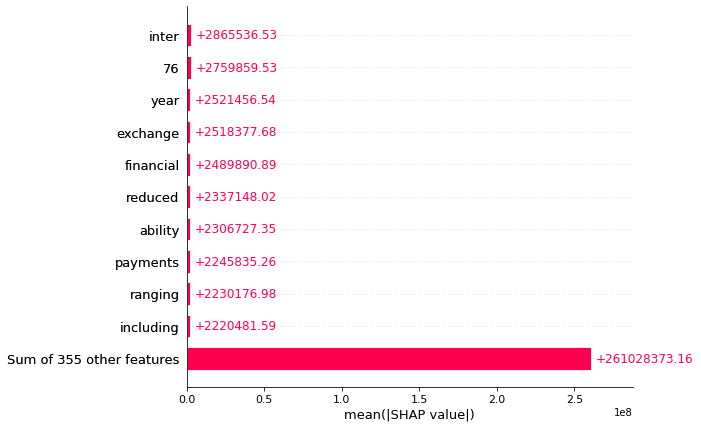

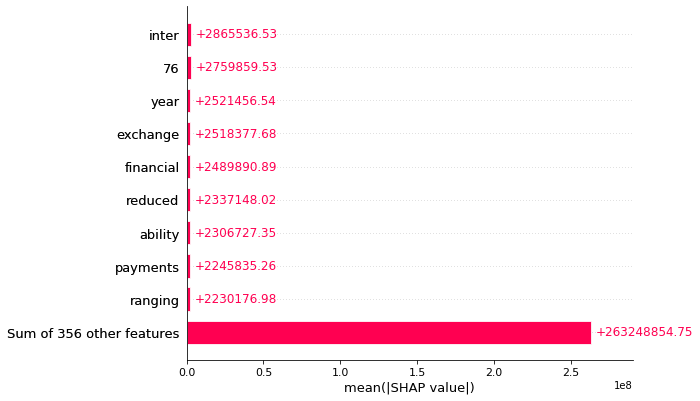

--------------INTERPRETING FINBERT REGRESSION MODEL OF NetIncomeLoss--------------


config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/439M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.26k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/226k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/712k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

PartitionExplainer explainer:   1%|          | 9/1000 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   4%|▎         | 35/1000 [00:42<19:08,  1.19s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   8%|▊         | 79/1000 [01:43<15:54,  1.04s/it]  

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   9%|▉         | 88/1000 [01:58<16:46,  1.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  11%|█         | 110/1000 [02:28<16:16,  1.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  14%|█▍        | 143/1000 [03:15<17:24,  1.22s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  16%|█▌        | 156/1000 [03:40<13:50,  1.02it/s]  

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  21%|██        | 210/1000 [04:51<16:07,  1.22s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  22%|██▏       | 215/1000 [05:03<19:02,  1.46s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  27%|██▋       | 268/1000 [06:08<14:32,  1.19s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  28%|██▊       | 275/1000 [06:20<15:49,  1.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  29%|██▉       | 288/1000 [06:41<14:59,  1.26s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  32%|███▏      | 315/1000 [07:18<10:09,  1.12it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  34%|███▍      | 342/1000 [07:47<10:16,  1.07it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  36%|███▋      | 365/1000 [08:20<08:51,  1.20it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  37%|███▋      | 374/1000 [08:38<12:34,  1.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  40%|████      | 400/1000 [09:17<19:49,  1.98s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  41%|████      | 410/1000 [09:37<12:46,  1.30s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  42%|████▎     | 425/1000 [10:05<12:30,  1.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  43%|████▎     | 433/1000 [10:21<12:18,  1.30s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  48%|████▊     | 476/1000 [11:16<07:25,  1.18it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  55%|█████▌    | 553/1000 [12:52<06:46,  1.10it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  64%|██████▎   | 635/1000 [14:35<05:27,  1.11it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  67%|██████▋   | 670/1000 [15:18<11:59,  2.18s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  68%|██████▊   | 684/1000 [15:36<04:06,  1.28it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  72%|███████▏  | 715/1000 [16:13<04:21,  1.09it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  77%|███████▋  | 773/1000 [17:24<03:05,  1.22it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  82%|████████▏ | 822/1000 [18:27<02:51,  1.04it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  82%|████████▏ | 823/1000 [18:33<07:24,  2.51s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  86%|████████▌ | 856/1000 [19:20<02:31,  1.05s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  90%|█████████ | 901/1000 [20:18<01:06,  1.49it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  93%|█████████▎| 931/1000 [20:50<01:00,  1.15it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 1001it [22:16,  1.35s/it]                          


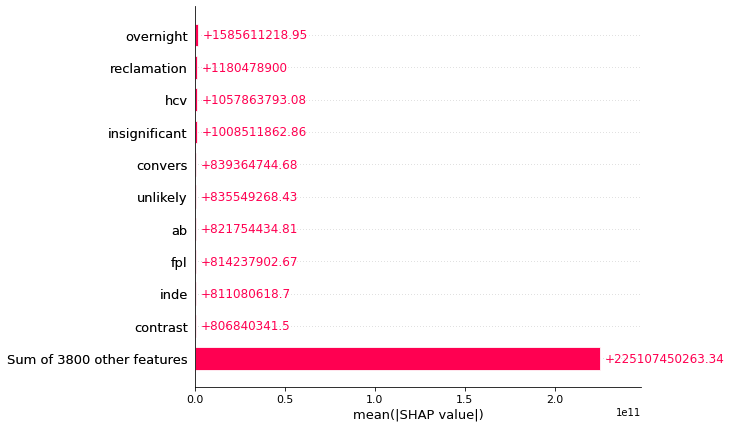

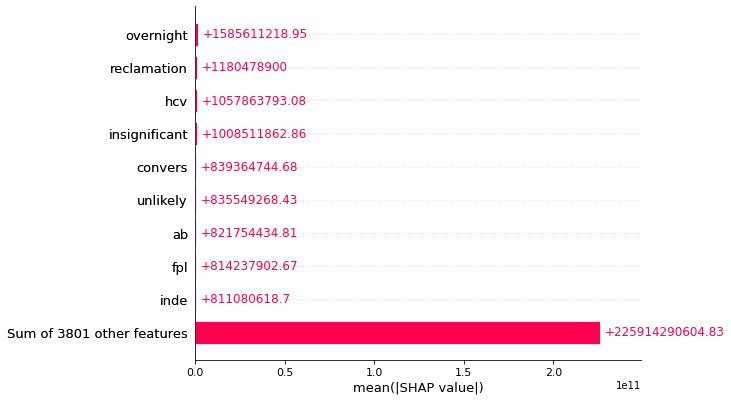

--------------INTERPRETING FINBERT REGRESSION MODEL OF RevenueFromContractWithCustomerExcludingAssessedTax--------------


config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/439M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.26k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/226k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/712k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   7%|▋         | 69/1000 [01:20<12:37,  1.23it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:   9%|▉         | 94/1000 [02:01<14:49,  1.02it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  10%|▉         | 98/1000 [02:16<35:59,  2.39s/it]  

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  17%|█▋        | 168/1000 [03:36<12:31,  1.11it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  18%|█▊        | 177/1000 [03:51<19:26,  1.42s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  18%|█▊        | 184/1000 [04:04<14:49,  1.09s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 204/1000 [04:30<11:44,  1.13it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  21%|██        | 208/1000 [04:42<22:58,  1.74s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  22%|██▏       | 215/1000 [04:55<15:08,  1.16s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  33%|███▎      | 326/1000 [06:33<16:46,  1.49s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  33%|███▎      | 331/1000 [06:46<20:44,  1.86s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  36%|███▋      | 363/1000 [07:17<08:29,  1.25it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  43%|████▎     | 428/1000 [08:21<08:11,  1.16it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  54%|█████▎    | 536/1000 [10:15<06:32,  1.18it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  57%|█████▋    | 571/1000 [10:56<07:21,  1.03s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  58%|█████▊    | 582/1000 [11:16<10:56,  1.57s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  67%|██████▋   | 669/1000 [12:44<04:51,  1.13it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  67%|██████▋   | 672/1000 [12:56<12:51,  2.35s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  76%|███████▌  | 757/1000 [14:40<03:44,  1.08it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|███████▉  | 795/1000 [15:22<03:20,  1.02it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  81%|████████  | 808/1000 [15:44<03:13,  1.01s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  92%|█████████▏| 923/1000 [18:06<01:19,  1.04s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  94%|█████████▍| 941/1000 [18:30<00:50,  1.16it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  97%|█████████▋| 968/1000 [19:03<00:23,  1.37it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 1001it [19:50,  1.20s/it]                          


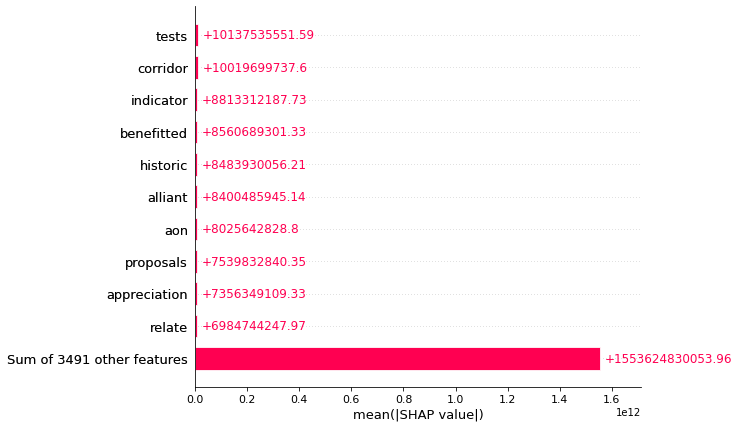

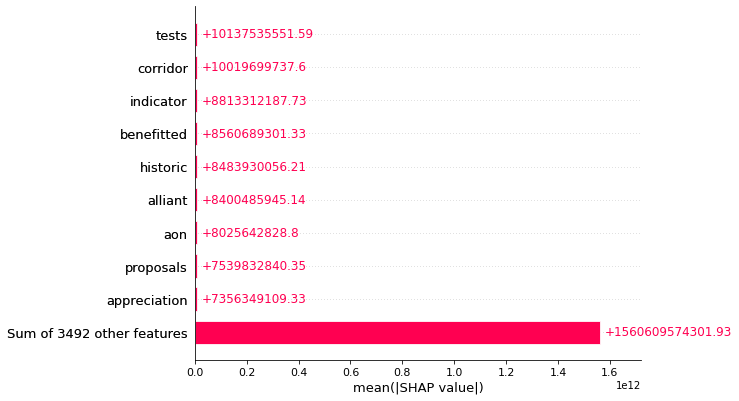

In [17]:
for i in range(len(fb_files)):
    file = fb_files[i]
    metric_name = file.split('.')[0].split('_')[0]
    
    print(f"--------------INTERPRETING FINBERT REGRESSION MODEL OF {metric_name}--------------")
    
    # Specify the paths to load the data, model and scaler 
    try: 
        hub_path = 'lenguyen/' + 'finbert_' + metric_name
        scaler_path = '../../models/finbert-regression/finbert_data/' + metric_name + '_scaler.pkl'
        
        # Load data, model and scaler
        data, model, tokenizer, scaler = load_data_model_and_scaler(fb_data_path, file, hub_path, scaler_path)
        
        # Explain the model
        shap_values = shap_interpret_model(data, model, tokenizer, scaler, n_samples=1000)
        
        # Save shap values
        joblib.dump(shap_values, f'../../models/finbert-regression/finbert_data/{metric_name}_shap-values.pkl')
        
        
    except (Exception) as e:
        if e == 'HTTPError':
            print(f"ERROR: {metric_name} model is not available in hub")
            continue
        else:
            print(e)
            break


# Check specific cases

## FBR_FB

In [3]:
# Load shap values
fb_ebit_shap_values = joblib.load(open(f'../../models/finbert-regression/finbert_data/EBIT_shap-values.pkl','rb'))

In [7]:
fb_ebit_shap_values.data

(array(['', 'projecting ', 'future ', 'taxable ', 'income ', 'begin ',
        'historical ', 'results ', 'adjusted ', 'results ',
        'discontinued ', 'operations ', 'incorporate ', 'assumptions ',
        'future ', 'state ', 'federal ', 'foreign ', 'pretax ',
        'operating ', 'income ', 'adjusted ', 'items ', 'tax ',
        'consequences', ''], dtype=object),
 array(['', 'focused ', 'approach ', 'expect ', 'fiscal ', '2017 ',
        'organic ', 'net ', 'sales ', 'growth ', 'ranging ', 'flat ',
        'percent ', 'compared ', 'fiscal ', '2016 ', 'deliver ',
        'percent ', 'increase ', 'constant ', 'currency ', 'total ',
        'segment ', 'operating ', 'profit', ''], dtype=object),
 array(['', 'actual ', 'future ', 'results ', 'developments ', 'conform ',
        'expectations ', 'predictions ', 'subject ', 'number ', 'risks ',
        'uncertainties ', 'including ', 'following ', 'factors ',
        'control ', 'demand ', 'market ', 'acceptance ', 'risks ',
       

## DB_EPS

In [4]:
db_eps_shap_values = joblib.load(open(f'../../models/finbert-regression/distilbert_data/EarningsPerShareDiluted_shap-values.pkl','rb'))

check the token fid

In [12]:
shap.plots.text(db_eps_shap_values[102])

check feature infrequent

In [13]:
shap.plots.text(db_eps_shap_values[98])

## FB_EPS

In [14]:
fb_eps_shap_values = joblib.load(open(f'../../models/finbert-regression/finbert_data/EarningsPerShareDiluted_shap-values.pkl','rb'))

accretive

In [19]:
shap.plots.text(fb_eps_shap_values[1])

In [20]:
shap.plots.text(fb_eps_shap_values[4])

In [21]:
shap.plots.text(fb_eps_shap_values[35])

In [24]:
shap.plots.text(fb_eps_shap_values[106])

operating

In [18]:
shap.plots.text(fb_eps_shap_values[2])

coug

In [25]:
shap.plots.text(fb_eps_shap_values[269])

decrease

In [27]:
shap.plots.text(fb_eps_shap_values[0])

tif

In [33]:
shap.plots.text(fb_eps_shap_values[86])

203

In [39]:
shap.plots.text(fb_eps_shap_values[90])

ensure

In [40]:
shap.plots.text(fb_eps_shap_values[181])

ending

In [42]:
shap.plots.text(fb_eps_shap_values[142])

currently

In [43]:
shap.plots.text(fb_eps_shap_values[35])

In [44]:
shap.plots.text(fb_eps_shap_values[68])

gaap

In [45]:
shap.plots.text(fb_eps_shap_values[140])

In [46]:
shap.plots.text(fb_eps_shap_values[184])

## DB_ICF

In [54]:
db_icf_shap_values = joblib.load(open(f'../../models/finbert-regression/distilbert_data/NetCashProvidedByUsedInInvestingActivities_shap-values.pkl','rb'))

needs

In [55]:
shap.plots.text(db_icf_shap_values[30])

payments

In [56]:
shap.plots.text(db_icf_shap_values[8])

inter

In [57]:
shap.plots.text(db_icf_shap_values[5])

delay

In [58]:
shap.plots.text(db_icf_shap_values[9])

period/commercial

In [59]:
shap.plots.text(db_icf_shap_values[8])

anticipate/actual

In [61]:
shap.plots.text(db_icf_shap_values[5])

resource

In [62]:
shap.plots.text(db_icf_shap_values[3])

program

In [63]:
shap.plots.text(db_icf_shap_values[30])

## FB_ICF

In [65]:
fb_icf_shap_values = joblib.load(open(f'../../models/finbert-regression/finbert_data/NetCashProvidedByUsedInInvestingActivities_shap-values.pkl','rb'))

inter/exchange/financial

In [66]:
shap.plots.text(fb_icf_shap_values[5])

76

In [67]:
shap.plots.text(fb_icf_shap_values[24])

year/reduced

In [68]:
shap.plots.text(fb_icf_shap_values[2])

ability/including

In [69]:
shap.plots.text(fb_icf_shap_values[0])

payments

In [70]:
shap.plots.text(fb_icf_shap_values[8])

ranging

In [71]:
shap.plots.text(fb_icf_shap_values[28])

## DB_INCOME

In [80]:
import pandas as pd

In [72]:
db_income_shap_values = joblib.load(open(f'../../models/finbert-regression/distilbert_data/NetIncomeLoss_shap-values.pkl','rb'))

In [81]:
income_data = pd.read_csv('../../data/distilbert_data/train/NetIncomeLoss_train__text_clean.csv')

In [84]:
income_sample = income_data.sample(1000, random_state=42)
income_sample = income_sample.reset_index(drop=True)    

In [85]:
# save income sample
income_sample.to_csv('../../data/03_result reviews/db_NetIncomeLoss_train__text_clean_sample.csv', index=False)

multiplied

In [86]:
shap.plots.text(db_income_shap_values[22])

opposite

In [87]:
shap.plots.text(db_income_shap_values[418])

proportion

In [88]:
shap.plots.text(db_income_shap_values[431])

In [89]:
shap.plots.text(db_income_shap_values[106])

ibm

In [90]:
shap.plots.text(db_income_shap_values[213])

packaging

In [91]:
shap.plots.text(db_income_shap_values[920])

deep

In [92]:
shap.plots.text(db_income_shap_values[602])

economically

In [93]:
shap.plots.text(db_income_shap_values[149])

multi

In [97]:
shap.plots.text(db_income_shap_values[288])

In [98]:
shap.plots.text(db_income_shap_values[510])

airline

In [99]:
shap.plots.text(db_income_shap_values[310])

In [100]:
shap.plots.text(db_income_shap_values[539])

series

In [101]:
shap.plots.text(db_income_shap_values[327])

## FB_INCOME

In [5]:
fb_income_shap_values = joblib.load(open(f'../../models/finbert-regression/finbert_data/NetIncomeLoss_shap-values.pkl','rb'))

In [104]:
fb_income_data = pd.read_csv('../../data/02_processed/finbert_data/train/NetIncomeLoss_train__text_clean.csv')
fb_income_sample = fb_income_data.sample(1000, random_state=42)
fb_income_sample = fb_income_sample.reset_index(drop=True)    

# save data
fb_income_sample.to_csv('../../data/03_result reviews/fb_NetIncomeLoss_train__text_clean_sample.csv', index=False)

overnight

In [105]:
shap.plots.text(fb_income_shap_values[35])

reclamation

In [108]:
shap.plots.text(fb_income_shap_values[767])

hcv

In [110]:
shap.plots.text(fb_income_shap_values[945])

insignificant

In [111]:
shap.plots.text(fb_income_shap_values[318])

convers

In [113]:
shap.plots.text(fb_income_shap_values[649])

In [114]:
shap.plots.text(fb_income_shap_values[94])

unlikely

In [115]:
shap.plots.text(fb_income_shap_values[531])

fpl

In [6]:
shap.plots.text(fb_income_shap_values[485])

inde

In [14]:
shap.plots.text(fb_income_shap_values[912])

In [16]:
shap.plots.text(fb_income_shap_values[951])

In [17]:
shap.plots.text(fb_income_shap_values[33])

contrast

In [18]:
shap.plots.text(fb_income_shap_values[110])

## DB_REVENUE

In [3]:
db_revenue_data = pd.read_csv('../../data/02_processed/distilbert_data/train/RevenueFromContractWithCustomerExcludingAssessedTax_train__text_clean.csv')
db_revenue_sample = db_revenue_data.sample(1000, random_state=42)
db_revenue_sample = db_revenue_sample.reset_index(drop=True)

# save data
db_revenue_sample.to_csv('db_revenue_sample.csv', index=False)

In [4]:
db_revenue_shap_values = joblib.load(open(f'../../models/finbert-regression/distilbert_data/RevenueFromContractWithCustomerExcludingAssessedTax_shap-values.pkl','rb'))

tests

In [11]:
shap.plots.text(db_revenue_shap_values[455])

389

In [16]:
shap.plots.text(db_revenue_shap_values[469])

wacc

In [17]:
shap.plots.text(db_revenue_shap_values[802])

recover

In [23]:
shap.plots.text(db_revenue_shap_values[3])

In [26]:
shap.plots.text(db_revenue_shap_values[6])

In [27]:
shap.plots.text(db_revenue_shap_values[101])

In [28]:
shap.plots.text(db_revenue_shap_values[216])

In [29]:
shap.plots.text(db_revenue_shap_values[882])

In [24]:
shap.plots.text(db_revenue_shap_values[141])

summarizes

In [33]:
shap.plots.text(db_revenue_shap_values[89])

comparability

In [34]:
shap.plots.text(db_revenue_shap_values[7])

alternatives

In [35]:
shap.plots.text(db_revenue_shap_values[838])

anticipating

In [36]:
shap.plots.text(db_revenue_shap_values[320])

specifically

In [37]:
shap.plots.text(db_revenue_shap_values[149])

utilizes

In [40]:
shap.plots.text(db_revenue_shap_values[12])

In [38]:
shap.plots.text(db_revenue_shap_values[479])

## FB_REV

In [41]:
fb_revenue_data = pd.read_csv('../../data/02_processed/finbert_data/train/RevenueFromContractWithCustomerExcludingAssessedTax_train__text_clean.csv')
fb_revenue_sample = fb_revenue_data.sample(1000, random_state=42)
fb_revenue_sample = fb_revenue_sample.reset_index(drop=True)

# save data
fb_revenue_sample.to_csv('fb_revenue_sample.csv', index=False)

In [42]:
fb_revenue_shap_values = joblib.load(open(f'../../models/finbert-regression/finbert_data/RevenueFromContractWithCustomerExcludingAssessedTax_shap-values.pkl','rb'))

tests

In [43]:
shap.plots.text(fb_revenue_shap_values[595])

corridor

In [44]:
shap.plots.text(fb_revenue_shap_values[346])

indicator

In [45]:
shap.plots.text(fb_revenue_shap_values[687])

In [46]:
shap.plots.text(fb_revenue_shap_values[999])

benefitted

In [47]:
shap.plots.text(fb_revenue_shap_values[212])

historic

In [49]:
shap.plots.text(fb_revenue_shap_values[700])

In [50]:
shap.plots.text(fb_revenue_shap_values[918])

alliant

In [51]:
shap.plots.text(fb_revenue_shap_values[104])

aon

In [52]:
shap.plots.text(fb_revenue_shap_values[606])

proposals

In [53]:
shap.plots.text(fb_revenue_shap_values[280])

appreciation

In [54]:
shap.plots.text(fb_revenue_shap_values[734])

relate

In [57]:
shap.plots.text(fb_revenue_shap_values[840])